In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#  Segment Satellite Imagery using NDVI

_Use rasterio to Segment Canopy Cover from Soil Easily_

In this post we'll be trying to segment canopy cover and soil satellite imagery. So ideally we'll go from this:


To this:


We'll be borrowing ideas from [this paper](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0196605). It implements exactly what we need for sorghum. 

I'll also be using ideas from my [previous](https://towardsdatascience.com/segment-satellite-images-using-rasterio-and-scikit-learn-fc048f465874) blog post on this topic.


# Install

First we'll need to install a few things

In [ ]:
import shutil
import glob
import zipfile
import os

#import required libraries
!pip install rasterio
import rasterio
from rasterio import plot
import matplotlib.pyplot as plt
import numpy as np
from rasterio.plot import show
%matplotlib inline

     |████████████████████████████████| 18.3MB 1.2MB/s 


# Prep Dataset

This cell will copy across `.zip` files for Terrav data from google drive. Sentinel data files will need to be manually uploaded.


Once they are manually uploaded run the cells here.

In [ ]:
%cd /content/

# copying over: 
# - canopy_cover_cotton_ea36717ca661ca3cca59d5ea43a81afc_20190502T113544_TERRAV_PLN.zip
# - canopy_cover_cotton_ea36717ca661ca3cca59d5ea43a81afc_20190404T121854_TERRAV_PLN.zip

# function to create directory
def create_directory(directory_name):
	name = os.getcwd()+'/'+str(directory_name)
	try:
		os.makedirs(name)    
	except FileExistsError:
		shutil.rmtree(name)

zip_files = glob.glob('/content/drive/MyDrive/canopy_cover_cotton_*.zip')
for i in range(len(zip_files)):

  file = zip_files[i]
  folder = file.split('/')[-1].split('.')[0]
  path_to_zip_file = '/content/'+folder+'/zip_file.zip'
  directory_to_extract_to = '/content/'+folder+'/'
  # print(file)
  # print(folder)
  # print(path_to_zip_file)
  create_directory(folder)
  shutil.copyfile(file, path_to_zip_file)
  with zipfile.ZipFile(path_to_zip_file, 'r') as zip_ref:
      zip_ref.extractall(directory_to_extract_to)
  os.remove(path_to_zip_file)


/content


In [ ]:
# upload sentinel files first
# this section will unzip files into their own seperate folders

%cd /content
for file in glob.glob('*.zip'):
  folder = os.path.basename(file).split('.')[0].strip()
  create_directory(folder)
  output_dir = folder +'/'+os.path.basename(file)

  # copy zip file
  !cp $file $output_dir
  %cd $folder
  !unzip -q \*.zip
  !rm *.zip

  # go back to orig dir
  %cd /content/
  !rm $file


/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190429T135119_T21LXC_S2B
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190703T135121_T21LXC_S2A
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190124T135111_T21LXC_S2A
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190613T135121_T21LXC_S2A
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190718T135119_T21LXC_S2B
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190409T135119_T21LXC_S2B
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190708T135119_T21LXC_S2B
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190325T135111_T21LXC_S2A
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190524T135121_T21LXC_S2A
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190424T135121_T21LXC_S2A
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190320T135109_T21LXC_S2B
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190228T135109_T21LXC_S2B
/content
/content/9bbd67cfb0d660551d74decf916b2df2_20190203T1351

In [ ]:
# this section will rename sentinel files
# for the rest of the code to work they need to include `canopy_cover_cotton_` in their name

for file in glob.glob('*T21LXC*'):

  # date = file.split('/')[-1].split('_')[0]
  date = file.split('/')[-1].split('_')[1]

  # end_part = '_'.join(file.split('/')[-1].split('_')[1:2])
  end_part = '_'.join(os.path.basename(file).split('_')[2:-1])

  code = file.split('/')[-1].split('_')[0]

  print('code {}'.format(code))
  print('end_part {}'.format(end_part))
  print('date {}'.format(date))

  new_name =  'canopy_cover_cotton_'+str(code)+'_'+str(date)+'_'+str(end_part)+'_S2A'
  print(new_name)
  os.rename(file, new_name)

code 9bbd67cfb0d660551d74decf916b2df2
end_part T21LXC
date 20190529T135119
canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190529T135119_T21LXC_S2A
code 9bbd67cfb0d660551d74decf916b2df2
end_part T21LXC
date 20190414T135111
canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190414T135111_T21LXC_S2A
code 9bbd67cfb0d660551d74decf916b2df2
end_part T21LXC
date 20190409T135119
canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190409T135119_T21LXC_S2A
code 9bbd67cfb0d660551d74decf916b2df2
end_part T21LXC
date 20190330T135119
canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190330T135119_T21LXC_S2A
code 9bbd67cfb0d660551d74decf916b2df2
end_part T21LXC
date 20190124T135111
canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190124T135111_T21LXC_S2A
code 9bbd67cfb0d660551d74decf916b2df2
end_part T21LXC
date 20190718T135119
canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190718T135119_T21LXC_S2A
code 9bbd67cfb0d660551d74decf916b2df2
end_part T21LXC
date 20190713T13

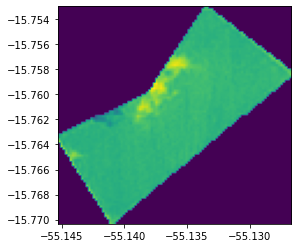

In [ ]:
files = glob.glob('/content/*cover*/*.tif')
for file in files[1:2]:
  raster = rasterio.open(file)
  show(raster)

# Helper functions

In [ ]:
from datetime import datetime, timedelta

# convert year, month day into year, month, day (+/- 2)
# takes in: 20190320T135109
# returns: [20190318*, 20190319*, 20190320*, 20190321*, 20190322*]
def date_time_plus_minus_2(text):
  date_object = datetime.strptime(str(text), "%Y%m%dT%H%M%S")
  
  # return [str(date_object.year) + str(date_object.strftime('%m')) + str(timedelta(days = i))\
  #         for i in range(date_object.day-2,date_object.day+3)]

  return [(date_object + timedelta(days = i)).strftime('%Y%m%d')
          for i in range(-2,3)]
  
print(date_time_plus_minus_2('20190330T135109'))

# taken from stylegan
def createImageGrid(images, scale=0.25, rows=1):
  w,h = images[0].size
  w = int(w*scale)
  h = int(h*scale)
  height = rows*h
  cols = ceil(len(images) / rows)
  width = cols*w
  canvas = PIL.Image.new('RGBA', (width,height), 'white')
  for i,img in enumerate(images):
    img = img.resize((w,h), PIL.Image.ANTIALIAS)
    canvas.paste(img, (w*(i % cols), h*(i // cols))) 
  return canvas

# taken from stylegan 
def imshow_func(a, format='png', jpeg_fallback=True):
  a = np.asarray(a, dtype=np.uint8)
  str_file = BytesIO()
  PIL.Image.fromarray(a).save(str_file, format)
  im_data = str_file.getvalue()
  try:
    disp = IPython.display.display(IPython.display.Image(im_data))
  except IOError:
    if jpeg_fallback and format != 'jpeg':
      print ('Warning: image was too large to display in format "{}"; '
            'trying jpeg instead.').format(format)
      return imshow_func(a, format='jpeg')
    else:
      raise
  return disp


"""
########## redundant code from binary array section ##############
  def get_date_from_text(self,text):

    text = os.path.basename(text).split('.')[0].split('_')[-1]
    datetime_date = datetime.strptime(text, '%Y%m%dT%H%M%S').date()
    # print(datetime_date)

    return datetime_date

  def get_date_from_text_date_only(self,text):

    text = os.path.basename(text).split('.')[0].split('_')[-1]
    datetime_date = datetime.strptime(text, '%Y%m%dT%H%M%S').date()
    # print(datetime_date)

    return datetime_date

  def create_img_grid(self, rows = 4, scale = 0.1):

    # get unique filename from list of files
    unique_files = ['_'.join(i.split('/')[-2].split('_')[3:4]) for i in self.files]
    unique_files = list(set(unique_files))

    for code in unique_files:

      # segmented image
      md5 = code.split('_')[0]
      files = glob.glob('/content/*'+str(md5)+'*/masked*.*g')
      files = sorted(files, key = lambda x: self.get_date_from_text_date_only(x))
      ndvi_masked_imgs = [Image.open(file) for file in files]

      # original image
      original_images = glob.glob('/content/drive/My Drive/flurosat/*'+str(code)+'*.*g')
      original_images = sorted(original_images, key = lambda x: self.get_date_from_text(x))
      original_images = [Image.open(file) for file in original_images]

      full_list =  ndvi_masked_imgs + original_images
      self.imshow_func(self.createImageGrid(full_list, scale=scale, rows = rows))
"""

['20190328', '20190329', '20190330', '20190331', '20190401']


"\n########## redundant code from binary array section ##############\n  def get_date_from_text(self,text):\n\n    text = os.path.basename(text).split('.')[0].split('_')[-1]\n    datetime_date = datetime.strptime(text, '%Y%m%dT%H%M%S').date()\n    # print(datetime_date)\n\n    return datetime_date\n\n  def get_date_from_text_date_only(self,text):\n\n    text = os.path.basename(text).split('.')[0].split('_')[-1]\n    datetime_date = datetime.strptime(text, '%Y%m%dT%H%M%S').date()\n    # print(datetime_date)\n\n    return datetime_date\n\n  def create_img_grid(self, rows = 4, scale = 0.1):\n\n    # get unique filename from list of files\n    unique_files = ['_'.join(i.split('/')[-2].split('_')[3:4]) for i in self.files]\n    unique_files = list(set(unique_files))\n\n    for code in unique_files:\n\n      # segmented image\n      md5 = code.split('_')[0]\n      files = glob.glob('/content/*'+str(md5)+'*/masked*.*g')\n      files = sorted(files, key = lambda x: self.get_date_from_text_date

# Plot Fractional vegetation index vs NDVI

Idea taken from this paper: https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0196605 

This section will plot fractional cover vs NDVI to obtain a suitable threshold for vegetation. Anything under the threshold is assumed to be soil and anything over is assumed to be canopy. 

Threshold was found to be `0.425`. See embedded graphs below for details.

In [ ]:
from sklearn.linear_model import LinearRegression
from scipy import stats
from pathlib import Path
from PIL import Image
from math import ceil
from io import BytesIO
import IPython.display
import PIL
import statistics
import warnings
warnings.filterwarnings('ignore')

%cd /content

class fc_vs_ndvi():

  def __init__(self):
    self.files = glob.glob('/content/canopy_cover_cotton*_TERRAV_PLN/red2.tif')
    self.canopy_cover = None
    self.folder_name = None
    self.date = None
    self.ndvi_thresholds = [i for i in np.linspace(0.3,0.8,11)]
    self.ndvi_threshold = self.ndvi_thresholds[0]
    self.folder_path = Path('fc_vs_ndvi_plots')
    self.plot_counter = 0
    self.slopes = []
    self.intercepts = []
    self.roi_ndvi_pixel_count = []
    try:
      os.mkdir(self.folder_path)
    except:
      pass

  def plot_for_all_thresholds(self):

    for threshold in self.ndvi_thresholds:
      self.ndvi_threshold = threshold
      self.driver_each_plot()

  def driver_each_plot(self):

    y,x = [],[]

    # empty list
    self.roi_ndvi_pixel_count = []

    for file in self.files:

      # ndvi
      ndvi = self.get_ndvi(file)

      # regions of interest
      roi_ndvi_top_half = self.get_region_of_interest(ndvi, multiplier = 1/4)
      roi_ndvi_bottom_half = self.get_region_of_interest(ndvi, multiplier = 3/4)

      # fractional cover
      fc = self.get_fc(ndvi)

      # append to lists
      y.append(fc)
      x.append(roi_ndvi_top_half)

      y.append(fc)
      x.append(roi_ndvi_bottom_half)
      
    # plot from lists
    self.plot_fc_vs_ndvi(fc=y,ndvi=x)

  def plot_fc_vs_ndvi(self, fc, ndvi):

    y = np.array(fc).reshape(1, -1)
    x = np.array(ndvi).reshape(1,-1)

    slope, intercept, r_value, p_value, std_err = stats.linregress(x,y)
    # plt.figure(figsize=(10,10))

    # append slopes and intercepts to global variables
    self.slopes += [slope]
    self.intercepts += [intercept]

    x = np.linspace(min(ndvi),max(ndvi),100)
    f, ax = plt.subplots(1,1,figsize=(10,10))
    ax.plot(x, slope*x+intercept, '-r', label='fc='+str(round(slope, 2))+'*ndvi+'+str(round(intercept, 2)), color='black')
    ax.set_title('Fractional Cover vs NDVI at threshold of '+ str(self.ndvi_threshold))

    # ax.legend(loc='upper left')
    # plt.scatter(x=ndvi, y=fc, c='red', edgecolors='black', s=[100 for i in range(len(ndvi))])

    scatter = ax.scatter(x=ndvi, y=fc, c=self.roi_ndvi_pixel_count, edgecolors='black', s=[100 for i in range(len(ndvi))])
    legend = ax.legend(*scatter.legend_elements(), loc="upper left", title="Region of Interest Pixel count")
    ax.add_artist(legend)

    ax.set_xlabel('Normalized difference vegetation index (NDVI)')
    ax.set_ylabel('Fractional Cover (fc)')
    # ax.text(0.6, 0.5,s='R^2 = {}'.format(round((r_value**2), 4)), fontdict={'fontsize':14, 'fontweight':'bold'})
    ax.text(min(ndvi)+0.8*(max(ndvi)-min(ndvi)), min(fc)+0.2*(max(fc)-min(fc)),s='R^2 = {}'.format(round((r_value**2), 4)), fontdict={'fontsize':14, 'fontweight':'bold'})
    f.savefig('fc_vs_ndvi_plots/fc_vs_ndvi_'+str(self.plot_counter)+'.jpg')
    self.plot_counter +=1
    f.show()

  def get_fc(self, ndvi):

    ndvi_copy = ndvi.copy()

    vegetation = np.where(ndvi_copy > self.ndvi_threshold, 1, 0)
    vegetation_count = np.count_nonzero(vegetation)

    total = ndvi_copy.shape[0]*ndvi_copy.shape[1]
    fractional_cover = vegetation_count/total

    return fractional_cover

  def get_ndvi(self, red_file):

    nir_file = os.path.dirname(red_file) + '/nir.tif'
    band_red = rasterio.open(red_file)
    band_nir = rasterio.open(nir_file)
    red = band_red.read(1).astype('float64')
    nir = band_nir.read(1).astype('float64')

    # ndvi calculation, empty cells or nodata cells are reported as 0
    ndvi=np.where( (nir==0.) | (red ==0.), -255 , np.where((nir+red)==0., 0, (nir-red)/(nir+red)))

    return ndvi

  # get average of center two rows
  def get_region_of_interest(self, ndvi, multiplier = 1/2):

    # undo the background adjustment
    region = ndvi.copy()
    region = np.where(region==-255, 0, region)

    # mean of center rows
    # print(int((multiplier)*len(region)))
    center_row1 = np.mean(region[int((multiplier)*len(region))])
    center_row2 = np.mean(region[int((multiplier)*len(region))+1])

    # mean of both rows
    mean = (center_row1.copy()+center_row2.copy())/2

    # keep track of pixel count. For testing later on.
    center_row1_count = np.where(region[int((multiplier)*len(region))] == 0, 1, 1)
    center_row1_count = np.count_nonzero(center_row1_count)

    center_row2_count = np.where(region[int((multiplier)*len(region))+1] == 0, 1, 1)
    center_row2_count = np.count_nonzero(center_row2_count)

    self.roi_ndvi_pixel_count += [center_row1_count+center_row2_count]

    return mean

  def plot_all_regression_lines(self):

    x = np.linspace(0,1,100)

    plt.figure(figsize=(15,15))
    for i in range(min(len(self.slopes), len(self.intercepts))):

      slope = self.slopes[i]
      intercept = self.intercepts[i]
      threshold = self.ndvi_thresholds[i]
      
      plt.plot(x, slope*x+intercept, '-r', label='NDVI threshold level '+str(round(threshold,3)), color=np.random.rand(3,))
      plt.title('Fractional Cover vs NDVI combined')
      plt.legend(loc='upper left')
      plt.xlabel('Normalized difference vegetation index (NDVI)')
      plt.ylabel('Fractional Cover (fc)')
    
    # savefig
    plt.savefig('fc_vs_ndvi_plots/fc_vs_ndvi_all_combined.jpg')
    plt.show()

  def plot_as_group(self):
    files = glob.glob(str(self.folder_path/'*.jpg'))
    files = sorted(files, key = lambda x: int(''.join(x.split('_')[-1].split('.')[0])))
    list_imgs = [Image.open(file) for file in files]
    imshow_func(createImageGrid(list_imgs, scale=6, rows = 4))


/content


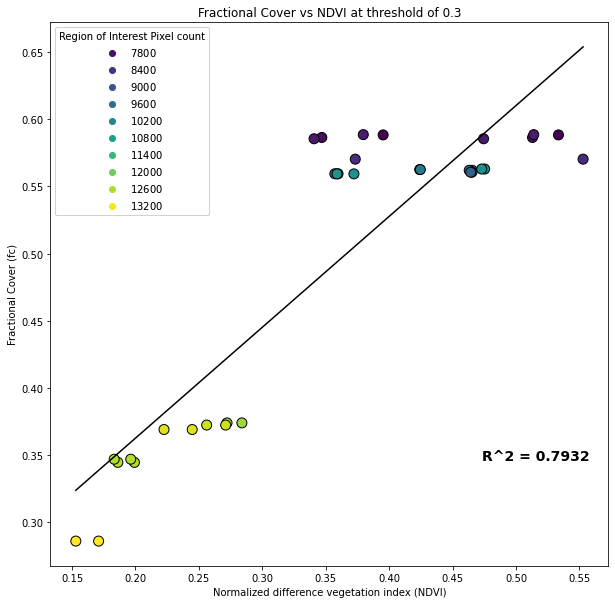

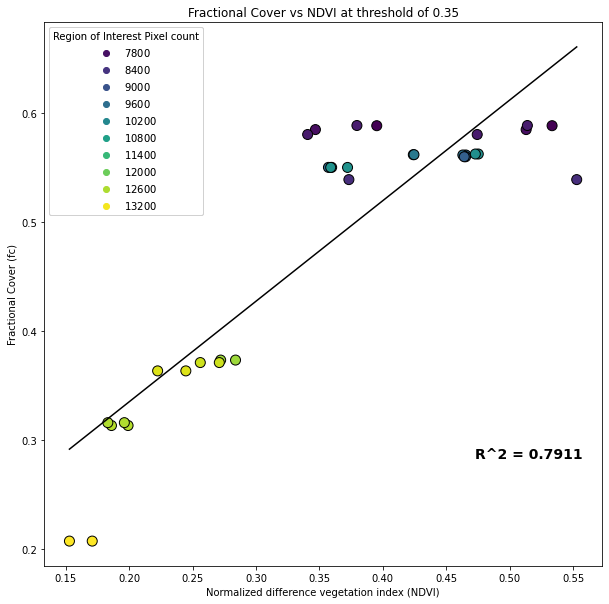

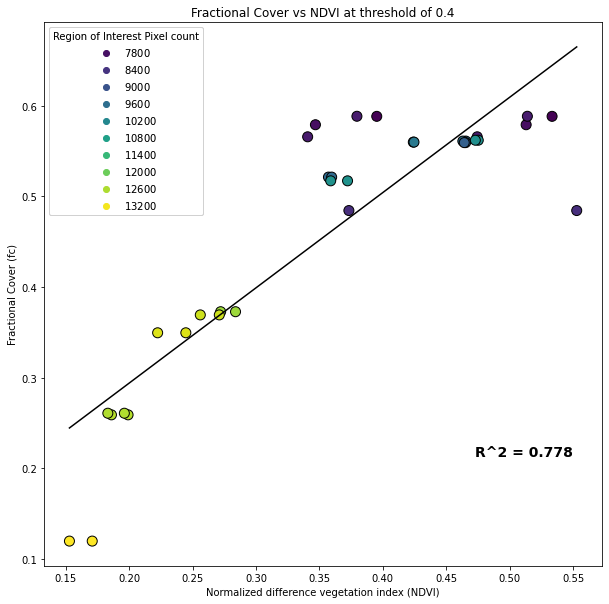

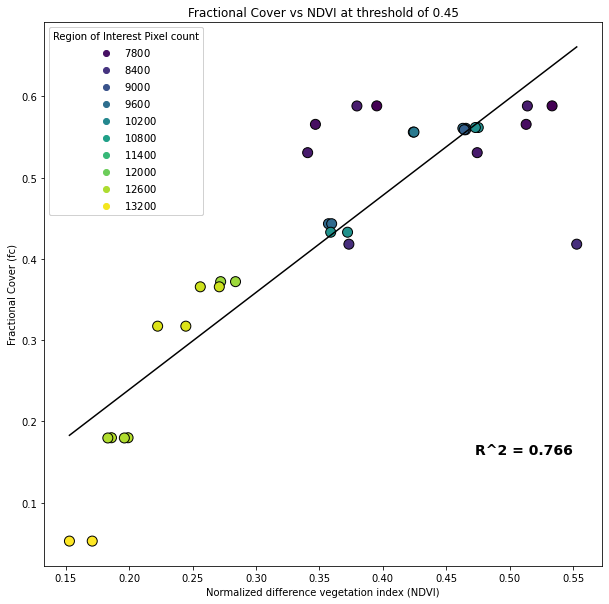

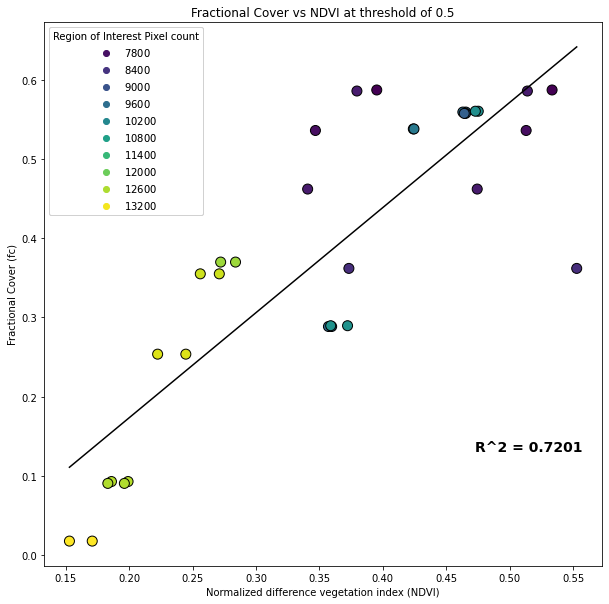

...

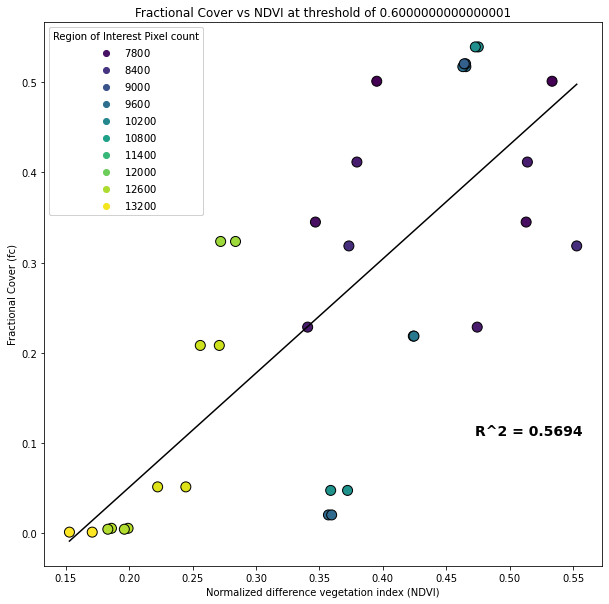

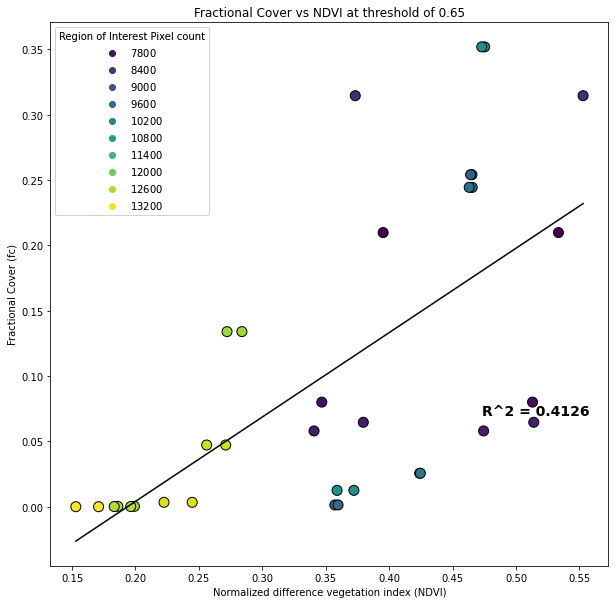

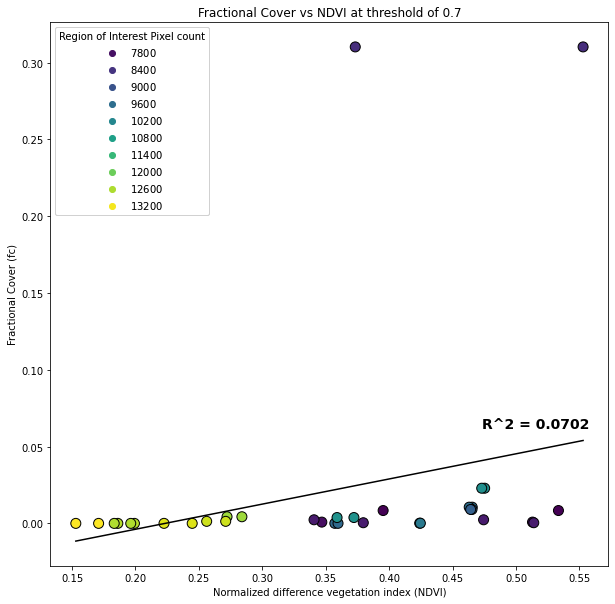

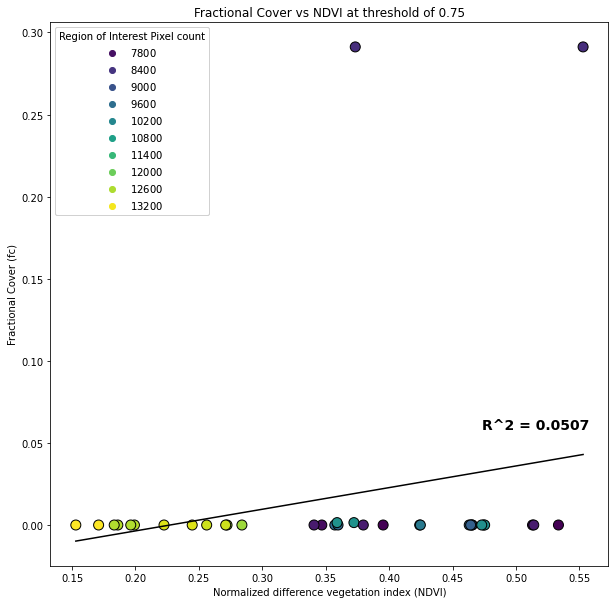

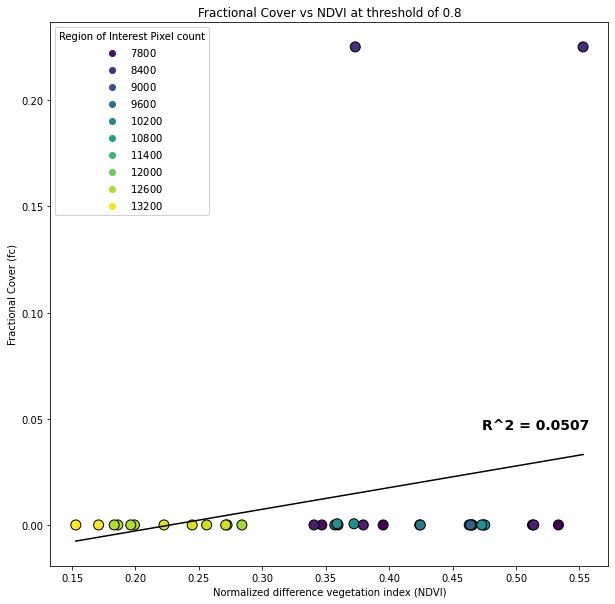

In [ ]:
plotter = fc_vs_ndvi()
plotter.plot_for_all_thresholds()

In [ ]:
plotter.plot_as_group()

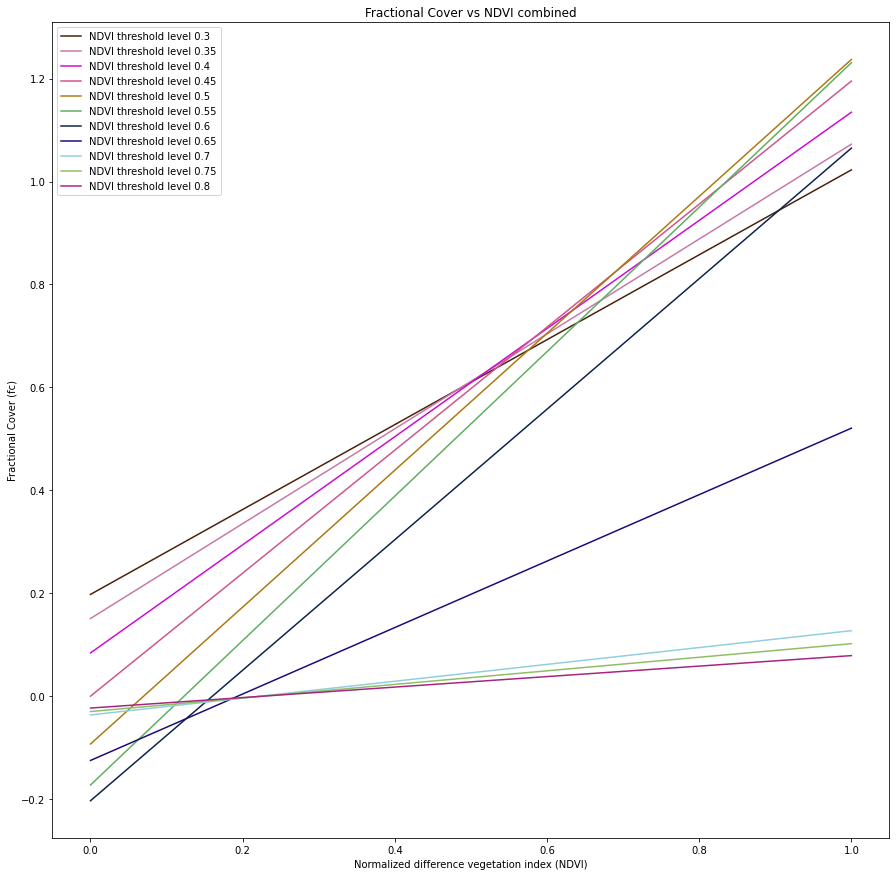

In [ ]:
plotter.plot_all_regression_lines()

# Create Binary Array for Image

- Takes in an ndvi threshold and creates a canopy cover bianry array. Currently the threshold is set to `0.425`. This has been calculated from the section: `Plot Fraction Vegetation Index vs NDVI`

- Downsamples this array to sentinel

- Saves array as a `txt` file and a `tif` file to a folder named: `[md5_code]`

- Offers visualisation options. Use `create_img_grid` after instantiating the class: `ndvi_binary_arr`



In [ ]:
SELECTED_BANDS = ["B03", "B04", "B05", "B06", "B07", "B8A", "B11", "B12"]

In [ ]:
import os
import glob
from pathlib import Path
from rasterio.enums import Resampling
import shutil
from math import ceil
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from datetime import datetime
from io import BytesIO
import IPython.display
from skimage.transform import resize, downscale_local_mean
import PIL
from PIL import Image
import cv2
import numpy as np
import random
from tqdm.notebook import tqdm

%cd /content

class ndvi_binary_arr():

  def __init__(self, ndvi=True, ndvi_threshold=0.425):
    
    self.files = glob.glob('/content/canopy_cover_cotton*_TERRAV_PLN/red2.tif')
    self.ndvi_threshold = ndvi_threshold
    self.canopy_cover = None
    self.folder_name = None
    self.date = None
    self.output_path = None
    self.segmented_image = None
    self.labels = None
    self.masked_image = None
    self.colors = [[255,97,3], [0,255,255], [131,111,255], [125,158,192]]

  def create_mask(self, red_file):

    nir_file = os.path.dirname(red_file) + '/nir.tif'
    band_red = rasterio.open(red_file)
    band_nir = rasterio.open(nir_file)
    red = band_red.read(1).astype('float64')
    nir = band_nir.read(1).astype('float64')

    # get raw ndvi and save as jpg
    self.raw_ndvi = np.where((nir+red)==0., np.nan, (nir-red)/(nir+red))
    
    # show(self.canopy_cover, cmap='YlOrRd')
    self.save_array_as_jpg(self.raw_ndvi, 'raw_', title = 'NDVI')

    # print('raw NDVI')
    # print(np.unique(self.raw_ndvi))

    # remove background (TODO: test this properly later)
    # self.canopy_cover = np.ma.masked_equal(self.canopy_cover,0)

    # create canopy cover mask
    self.canopy_cover = np.where(np.isnan(self.raw_ndvi), np.nan, np.where(self.raw_ndvi<self.ndvi_threshold, 0, 1))
    self.canopy_cover = np.ma.masked_where(np.isnan(self.canopy_cover), self.canopy_cover)

    # show ndvi mask and save it as jpg
    print('canopy cover')
    print(np.unique(self.canopy_cover))
    # self.save_array_as_jpg(self.canopy_cover, 'masked_', title = 'NDVI masked at threshold = ' + str(self.ndvi_threshold))


  def downsample_canopycovermap(self, canopycover_map, s2_data):
      """Downsample canopy cover map.
      Parameters
      ----------
      canopycover_map : np.array
          Canopy cover map of the same width and height as the Terravion image.
          Each pixel contains a value 0 or 1 (binary) which corresponds to
          canopy and no-canopy.
      s2_data : np.array
          Sentinel-2 image of the field. The shape is (width, height, bands).
      Returns
      -------
      canopycover_map_ds : np.array
          Canopy cover map downsampled to the same width and height as the 
    Sentinel-2 image `s2_data`. Each pixel contains a value from 0 to 1 
    representing the fraction of canopy cover.
      """

      # canopycover_map_ds = resize(canopycover_map, s2_data.shape[:2],
      #                             anti_aliasing=False)

      # canopycover_mask_ds = resize(canopycover_map.mask, s2_data.shape[:2],
      #                            anti_aliasing=False)
      # canopycover_map_ds_ma = np.ma.array(canopycover_map_ds,
      #                                     mask=canopycover_mask_ds)

      canopycover_map_ds = resize(canopycover_map, s2_data.shape[:2],
                                anti_aliasing=False)
      canopycover_mask_ds = resize(canopycover_map.mask, s2_data.shape[:2],
                                  anti_aliasing=False)
      canopycover_map_ds_ma = np.ma.array(canopycover_map_ds,
                                        mask=canopycover_mask_ds)

      # changed as I wanted to down-sampling with an integer factor
      # canopycover_map_ds = downscale_local_mean(canopycover_map, s2_data.shape[:2])
      
      return canopycover_map_ds

  def save_array_as_jpg(self, arr,  message = '', title = ''):

    self.output_path = self.folder_name+'/'+str(message)+self.date+'.jpg'
    if(os.path.exists(self.output_path)):
      os.remove(self.output_path)
    # self.canopy_cover.save(output_path)

    plt.imshow(arr)
    plt.title(title + ' '+ self.folder_name + ' ' + self.date)
    plt.imsave(self.output_path, arr, cmap=cm.YlOrRd)
    plt.show()

  def driver(self):

    for i in tqdm(range(len(self.files))):

      # get names
      file = self.files[i]
      self.folder_name = os.path.basename(os.path.dirname(file)).split('_')[3]
      self.date = os.path.basename(os.path.dirname(file)).split('_')[4]
      outfile = self.folder_name+'/' + self.date + '.tif'
      downsampled_outfile = self.folder_name+'/downsampled_arr_' + self.date + '.tif'

      # create folder
      if (not os.path.exists(self.folder_name)):
        os.makedirs(self.folder_name)

      # create ndvi
      self.create_mask(file)

      # export gtiff layer
      # self.export_gtiff_1layer_i_rasterio(array_image = self.canopy_cover, outfile = outfile, base_image = file, no_data = -999)

      # downsample array
      # self.get_sentinel_image_from_terra_image(file)
      self.sent_file = _get_sentinel_image(self.folder_name, self.date)

      # if we can find the sent file
      if (self.sent_file is not None):

        print(f'sentinel band has shape {self.sent_file.shape} and is')
        print(np.unique(self.sent_file))
        
        # get downsample array
        downsampled_arr = self.downsample_canopycovermap(self.canopy_cover,\
                                                         self.sent_file).astype(np.float32)
        print(f'downsampled array has shape {downsampled_arr.shape} and is')
        print(np.unique(downsampled_arr))

        # save downsampled array as jpg
        self.save_array_as_jpg(downsampled_arr, 'downsampled_arr_', title = 'Downsampled Array')

        # save as tif file
        # change -999 to np.nan
        self.export_gtiff_1layer_i_rasterio(downsampled_arr, downsampled_outfile, base_image = file, no_data = -999)
        show(rasterio.open(downsampled_outfile), title = 'downsampled array')
        plt.show()

        # save as txt
        downsampled_arr = np.uint8(downsampled_arr)
        np.savetxt('{}/downsampled_arr_{}.txt'.format(self.folder_name,self.date),downsampled_arr, fmt='%i')

      else:
        print('corresponding sentinel file could not be found\nskipping...')

  def export_gtiff_1layer_i_rasterio(self, array_image, outfile, base_image, no_data = 0):

    '''
    ------
    Description : Use the array of the image to write a RGBA uint8 georeferenced image. 
    ------
    ------
    Inputs :
        - array_image : array that will be converted as a geotiff 
        - outfile : geotif outpath destination
        - proj : proj to use, based on the raster that the array describes
        - geotransf : geo transform to use, based also on the raster
        - cmap : cmap to color the geotif
        - EPSG : EPSG to use for the geotiff
    ------
    Outputs : geotiff saved at the location outfile 
    '''

    array_image[np.isnan(array_image)] = no_data
    with rasterio.open(base_image) as base_ds:
        crs = base_ds.crs
        transform = base_ds.transform

    if (os.path.exists(outfile)):
      os.remove(outfile)

    new_dataset = rasterio.open(outfile, 'w', driver='GTiff', 
                                height=array_image.shape[0],
                                width=array_image.shape[1], count=1,
                                dtype=rasterio.float32, crs=crs,
                                transform=transform)
    
    new_dataset.nodata=no_data
    new_dataset.write(array_image, 1)
    new_dataset.close()


/content


In [ ]:
"""
functions to upscale sentinel files and stack them together
"""

def _upscale_driver(file, upscale_factor = 2):

    # shape = max(rasterio.open(file).shape)
    # if (shape < self.desired_shape):
    #   upscale_factor = 2
    # elif (shape > self.desired_shape):
    #   upscale_factor = 1/2

    with rasterio.open(file) as dataset:

        # resample data to target shape
        data = dataset.read(
            out_shape=(
                dataset.count,
                int(dataset.height * upscale_factor),
                int(dataset.width * upscale_factor)
            ),
            resampling=Resampling.bilinear
        )

        # scale image transform
        transform = dataset.transform * dataset.transform.scale(
            (dataset.width / data.shape[-1]),
            (dataset.height / data.shape[-2])
        )
    
    # squeeze and return
    return np.squeeze(data)



def _get_band_4_shape(band_4_paths):
  def _helper_band_4(search_str):

    # get shape
    bands = glob.glob(search_str)
    
    # print(bands)
    if (len(bands)<1):
      return None

    band_4 = bands[0]
    arr = rasterio.open(band_4)
    rows, cols = arr.shape
    
    # make even
    if (rows % 2 != 0): rows = rows - 1
    if (cols % 2 != 0): cols = cols - 1

    return rows, cols

  for band_4_path in band_4_paths:
    desired_shape = _helper_band_4(band_4_path)  
    if (desired_shape is not None):
      print(f'desired shape is {desired_shape}')
      return desired_shape
  return None

def _get_sentinel_image(folder_name, date, show_plot = True):
    
    print(folder_name)
    # get search strings for day (+- 2)
    search_strs = ['/content/canopy_cover_cotton_*'+str(folder_name)+'*'+str(date)+'*T21LXC*/*.tif'\
                   for date in date_time_plus_minus_2(date)]
    
    # band 4 path
    # year_month_date = str(date).split('T')[0] 
    band_4_paths = ['/content/canopy_cover_cotton_*'+str(folder_name)+'*'+str(date).split('T')[0]+'*T21LXC*/*4*.tif' for date in date_time_plus_minus_2(date)]
    # band_4_path = '/content/canopy_cover_cotton_*'+str(folder_name)+'*'+str(year_month_date)+'*T21LXC*/*4*.tif'
    # print(f'band 4 path is {band_4_path}')

    # get desired shape
    desired_shape = _get_band_4_shape(band_4_paths) 
    if desired_shape is None: return None
    desired_rows = desired_shape[0]
    desired_cols = desired_shape[1]
    
    # get bands
    files = []
    for search_str in search_strs:
      for file in glob.glob(search_str):
        if any(selected_band in file for selected_band in SELECTED_BANDS):
          files.append(file)

    # show plot
    if (show_plot):
      src = rasterio.open(files[0])
      show(src, title = f'sentintel plot for {os.path.dirname(file) + os.path.basename(file)}')
      plt.show()

    # create list of bands and return
    bands = []
    for file in files:
      
      # get band
      band = np.squeeze(rasterio.open(file).read())
      print(f'{file} original shape: {band.shape}')

      # get max shape
      shape = max(rasterio.open(file).shape)

      # upscale
      if (shape < max([desired_rows, desired_cols])):
        band = _upscale_driver(file)

      # delete offending row
      if band.shape[0] != desired_rows:
        band = np.delete(band, -1, axis=0)

      # delete offending col
      if band.shape[1] != desired_cols:
        band = np.delete(band, -1, axis=1)

      print(f'{file} new shape: {band.shape}')
      bands.append(band)
        
    # bands = [np.squeeze(rasterio.open(i).read()) for i in files]

    final_arr = np.dstack(bands)  # shape should be: (width = 128, height = 128, no of bands = 8)

    print(final_arr.shape)

    return final_arr

In [ ]:
creator = ndvi_binary_arr(ndvi_threshold=0.425)

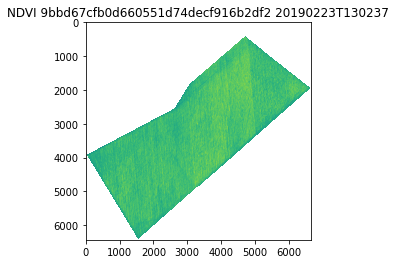

canopy cover
[0.0 1.0 --]
9bbd67cfb0d660551d74decf916b2df2
desired shape is (188, 202)


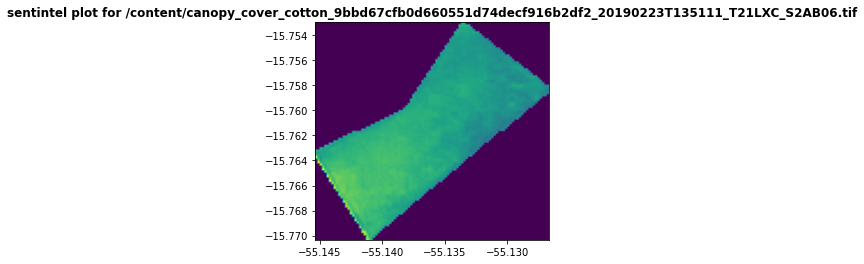

/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190223T135111_T21LXC_S2A/B8A.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190223T135111_T21LXC_S2A/B8A.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190223T135111_T21LXC_S2A/B03.tif original shape: (189, 203)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190223T135111_T21LXC_S2A/B03.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190223T135111_T21LXC_S2A/B05.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190223T135111_T21LXC_S2A/B05.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190223T135111_T21LXC_S2A/B11.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190223T135111_T21LXC_S2A/B11.tif new shape: (188, 202)
/content/canopy_cover_cotton_9b

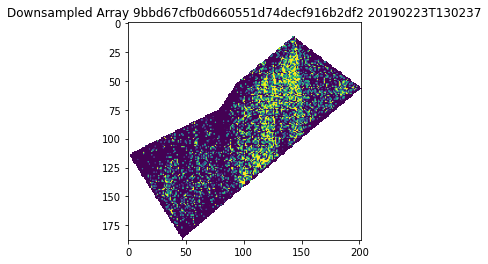

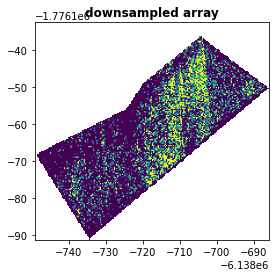

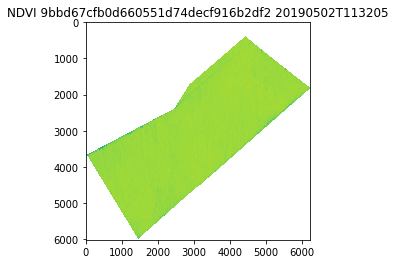

canopy cover
[0.0 1.0 --]
9bbd67cfb0d660551d74decf916b2df2
desired shape is (188, 202)


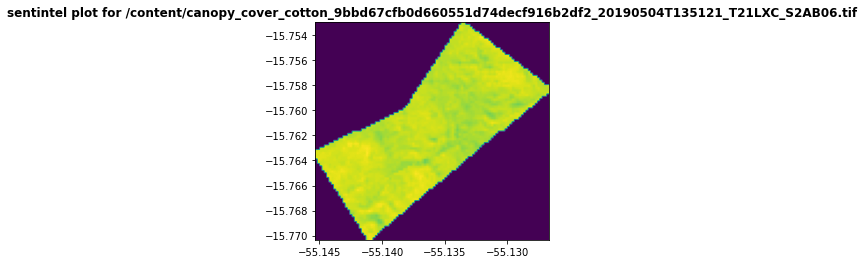

/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190504T135121_T21LXC_S2A/B8A.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190504T135121_T21LXC_S2A/B8A.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190504T135121_T21LXC_S2A/B03.tif original shape: (189, 203)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190504T135121_T21LXC_S2A/B03.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190504T135121_T21LXC_S2A/B05.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190504T135121_T21LXC_S2A/B05.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190504T135121_T21LXC_S2A/B11.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190504T135121_T21LXC_S2A/B11.tif new shape: (188, 202)
/content/canopy_cover_cotton_9b

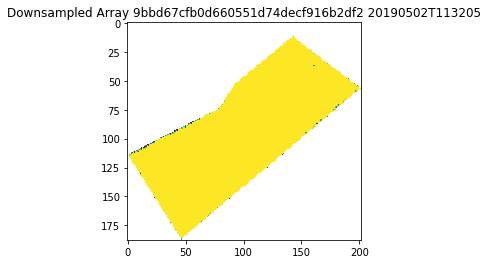

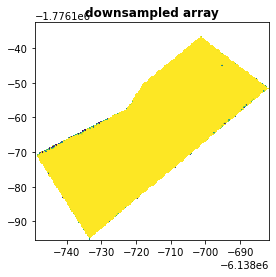

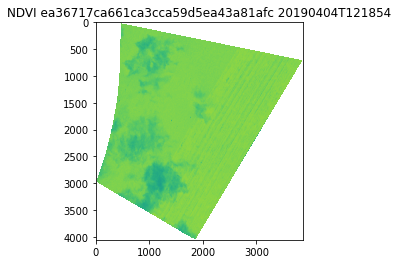

canopy cover
[0.0 1.0 --]
ea36717ca661ca3cca59d5ea43a81afc
corresponding sentinel file could not be found
skipping...


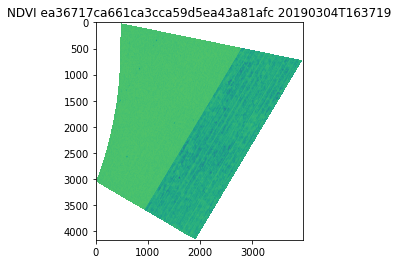

canopy cover
[0.0 1.0 --]
ea36717ca661ca3cca59d5ea43a81afc
corresponding sentinel file could not be found
skipping...


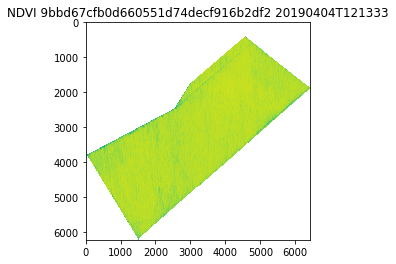

canopy cover
[0.0 1.0 --]
9bbd67cfb0d660551d74decf916b2df2
corresponding sentinel file could not be found
skipping...


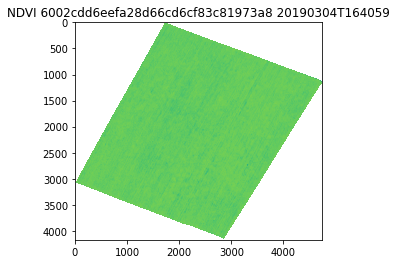

canopy cover
[0.0 1.0 --]
6002cdd6eefa28d66cd6cf83c81973a8
corresponding sentinel file could not be found
skipping...


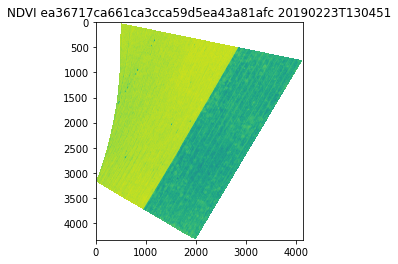

canopy cover
[0.0 1.0 --]
ea36717ca661ca3cca59d5ea43a81afc
corresponding sentinel file could not be found
skipping...


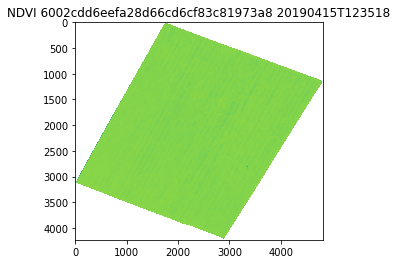

canopy cover
[0.0 1.0 --]
6002cdd6eefa28d66cd6cf83c81973a8
corresponding sentinel file could not be found
skipping...


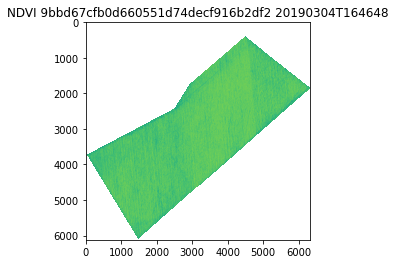

canopy cover
[0.0 1.0 --]
9bbd67cfb0d660551d74decf916b2df2
desired shape is (188, 202)


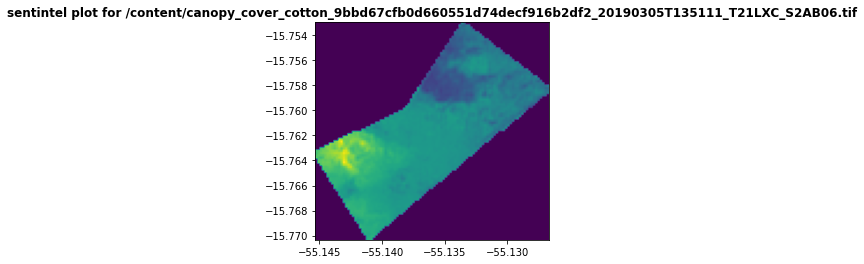

/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B8A.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B8A.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B03.tif original shape: (189, 203)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B03.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B05.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B05.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B11.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B11.tif new shape: (188, 202)
/content/canopy_cover_cotton_9b

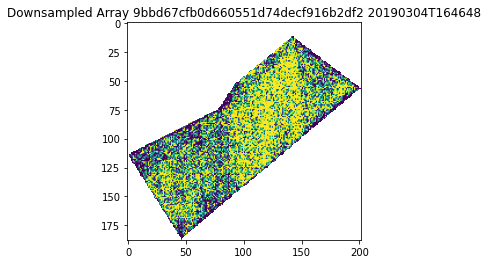

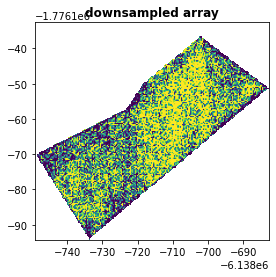

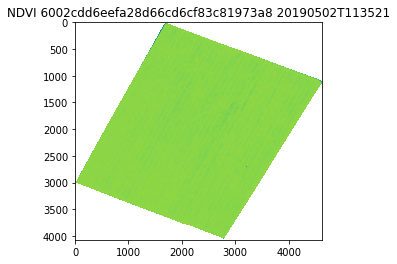

canopy cover
[0.0 1.0 --]
6002cdd6eefa28d66cd6cf83c81973a8
corresponding sentinel file could not be found
skipping...


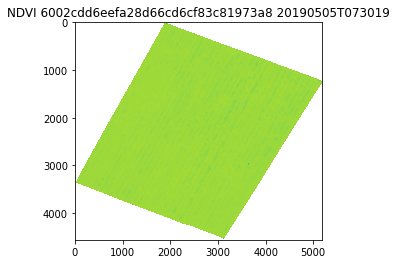

canopy cover
[0.0 1.0 --]
6002cdd6eefa28d66cd6cf83c81973a8
corresponding sentinel file could not be found
skipping...


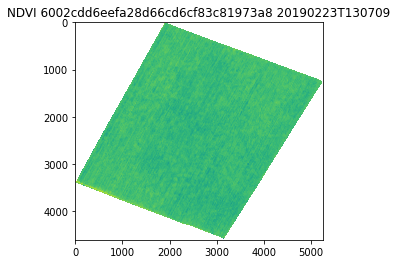

canopy cover
[0.0 1.0 --]
6002cdd6eefa28d66cd6cf83c81973a8
corresponding sentinel file could not be found
skipping...


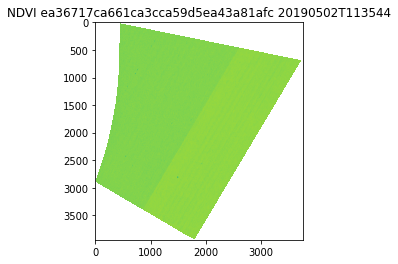

canopy cover
[0.0 1.0 --]
ea36717ca661ca3cca59d5ea43a81afc
corresponding sentinel file could not be found
skipping...


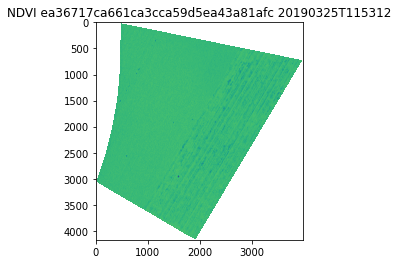

canopy cover
[0.0 1.0 --]
ea36717ca661ca3cca59d5ea43a81afc
corresponding sentinel file could not be found
skipping...


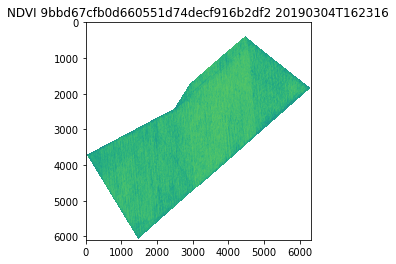

canopy cover
[0.0 1.0 --]
9bbd67cfb0d660551d74decf916b2df2
desired shape is (188, 202)


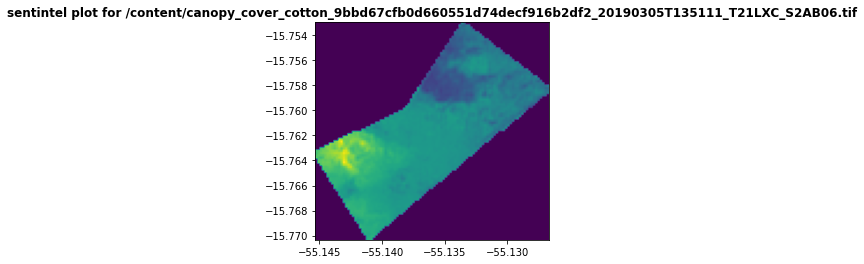

/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B8A.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B8A.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B03.tif original shape: (189, 203)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B03.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B05.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B05.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B11.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190305T135111_T21LXC_S2A/B11.tif new shape: (188, 202)
/content/canopy_cover_cotton_9b

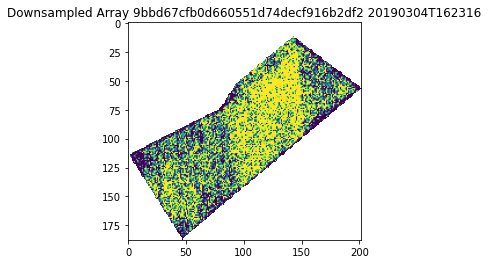

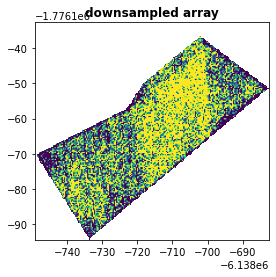

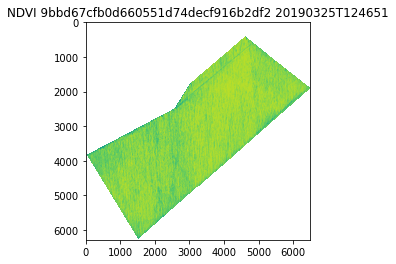

canopy cover
[0.0 1.0 --]
9bbd67cfb0d660551d74decf916b2df2
desired shape is (188, 202)


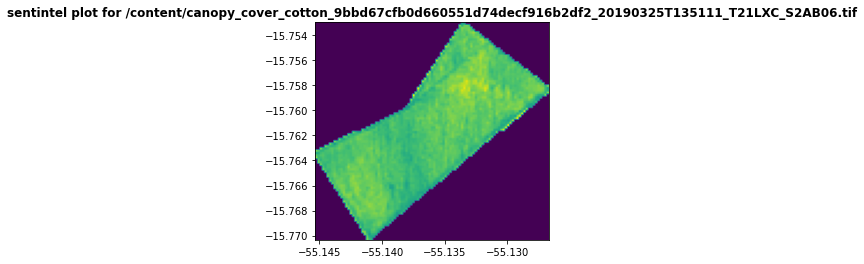

/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190325T135111_T21LXC_S2A/B8A.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190325T135111_T21LXC_S2A/B8A.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190325T135111_T21LXC_S2A/B03.tif original shape: (189, 203)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190325T135111_T21LXC_S2A/B03.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190325T135111_T21LXC_S2A/B05.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190325T135111_T21LXC_S2A/B05.tif new shape: (188, 202)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190325T135111_T21LXC_S2A/B11.tif original shape: (94, 101)
/content/canopy_cover_cotton_9bbd67cfb0d660551d74decf916b2df2_20190325T135111_T21LXC_S2A/B11.tif new shape: (188, 202)
/content/canopy_cover_cotton_9b

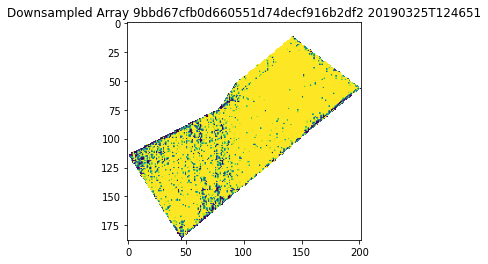

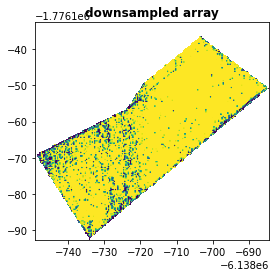

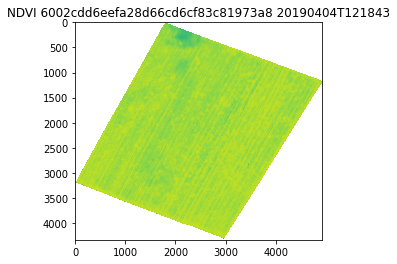

canopy cover
[0.0 1.0 --]
6002cdd6eefa28d66cd6cf83c81973a8
corresponding sentinel file could not be found
skipping...



In [ ]:
creator.driver()

In [ ]:
# creator.create_img_grid(rows = 8, scale = 1)